SfM models comparison. Three model - SuperGLUE+SuperPoint, LoFTR and LoFTR_Aachen - were compared.

In [1]:
%load_ext autoreload
%autoreload 2

# Progress bars tqdm
import tqdm, tqdm.notebook
tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars


from pathlib import Path


from hloc import extract_features, match_features, match_dense, reconstruction, visualization, pairs_from_exhaustive, pairs_from_retrieval
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

# Setup

In [2]:
# Data
images = Path('datasets/gerrard-hall/images')


outputs = Path('outputs_gerrard/')
outputs_ss = outputs / 'SuperPoint_GLUE'
outputs_loftr = outputs / 'LoFTR'
outputs_netvlad = outputs / 'netVLAD'


# !rm -rf $outputs


# Image retrieval
sfm_path = outputs_netvlad / 'pairs-sfm.txt'
retrieval_conf = extract_features.confs['netvlad']

# Structure from Motion 
sfm_dir_ss = outputs_ss / 'sfm'
sfm_dir_loftr = outputs_loftr / 'sfm'


# Features
superPoint_features = outputs_ss / 'features.h5'
features_loftr = outputs_loftr / 'features.h5'

# Matches
superGLUE_matches = outputs_ss / 'matches.h5'
matches_loftr = outputs_loftr / 'matches.h5'


# Configurations
# SuperPoint + SuperGLUE
superPoint_conf = extract_features.confs['superpoint_aachen']
superGLUE_conf = match_features.confs['superglue']

# LoFTR:
LoFTR_conf = match_dense.confs['loftr']

# SfM

Images

100 mapping images


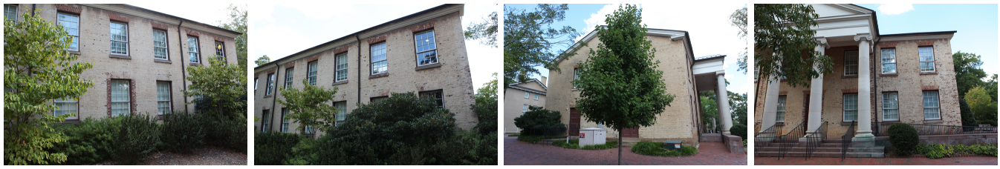

In [3]:
# Images
references = [p.relative_to(images).as_posix() for p in (images).iterdir()]

print(f"Mapping images{len(references)}")
plot_images([read_image(images / r) for r in references[:4]], dpi=50)

## Image Retrieval
NetVLAD for $\frac{n(n-1)}{2}$ pairs composing.

In [4]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs_netvlad)
pairs_from_retrieval.main(retrieval_path, sfm_path, num_matched=5)

[2022/12/13 01:29:37 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2022/12/13 01:29:37 hloc INFO] Found 100 images in root datasets/gerrard-hall/images.


  0%|          | 0/100 [00:00<?, ?it/s]

[2022/12/13 01:39:03 hloc INFO] Finished exporting features.
[2022/12/13 01:39:03 hloc INFO] Extracting image pairs from a retrieval database.
[2022/12/13 01:39:03 hloc INFO] Found 500 pairs.


{'IMG_2380.JPG': 0, 'IMG_2385.JPG': 0, 'IMG_2336.JPG': 0, 'IMG_2364.JPG': 0, 'IMG_2399.JPG': 0, 'IMG_2337.JPG': 0, 'IMG_2427.JPG': 0, 'IMG_2420.JPG': 0, 'IMG_2358.JPG': 0, 'IMG_2335.JPG': 0, 'IMG_2416.JPG': 0, 'IMG_2407.JPG': 0, 'IMG_2340.JPG': 0, 'IMG_2415.JPG': 0, 'IMG_2379.JPG': 0, 'IMG_2422.JPG': 0, 'IMG_2402.JPG': 0, 'IMG_2403.JPG': 0, 'IMG_2408.JPG': 0, 'IMG_2332.JPG': 0, 'IMG_2426.JPG': 0, 'IMG_2363.JPG': 0, 'IMG_2338.JPG': 0, 'IMG_2390.JPG': 0, 'IMG_2400.JPG': 0, 'IMG_2350.JPG': 0, 'IMG_2370.JPG': 0, 'IMG_2412.JPG': 0, 'IMG_2373.JPG': 0, 'IMG_2406.JPG': 0, 'IMG_2372.JPG': 0, 'IMG_2344.JPG': 0, 'IMG_2381.JPG': 0, 'IMG_2365.JPG': 0, 'IMG_2352.JPG': 0, 'IMG_2368.JPG': 0, 'IMG_2377.JPG': 0, 'IMG_2360.JPG': 0, 'IMG_2359.JPG': 0, 'IMG_2371.JPG': 0, 'IMG_2369.JPG': 0, 'IMG_2389.JPG': 0, 'IMG_2349.JPG': 0, 'IMG_2410.JPG': 0, 'IMG_2339.JPG': 0, 'IMG_2392.JPG': 0, 'IMG_2398.JPG': 0, 'IMG_2423.JPG': 0, 'IMG_2401.JPG': 0, 'IMG_2353.JPG': 0, 'IMG_2345.JPG': 0, 'IMG_2418.JPG': 0, 'IMG_2334.J

## SuperPoint + SuperGLUE

featuring

In [5]:
# outputs/SuperPoint_GLUE/features.h5
extract_features.main(superPoint_conf, images, image_list=references, feature_path=superPoint_features)

[2022/12/13 01:39:46 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


  0%|          | 0/100 [00:00<?, ?it/s]

[2022/12/13 01:43:28 hloc INFO] Finished exporting features.


PosixPath('outputs_gerrard/SuperPoint_GLUE/features.h5')

matching

In [6]:
# outputs/SuperPoint_GLUE/matches.h5
match_features.main(superGLUE_conf, sfm_path, features=superPoint_features, matches=superGLUE_matches);

[2022/12/13 01:43:28 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


/home/nadir/anaconda3/envs/StudProject/lib/python3.9/site-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 5 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


  0%|          | 0/308 [00:00<?, ?it/s]

[2022/12/13 03:36:26 hloc INFO] Finished exporting matches.


Reconstruction

In [7]:
model = reconstruction.main(sfm_dir_ss, images, sfm_path, superPoint_features, superGLUE_matches, image_list=references)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

[2022/12/13 03:37:51 hloc INFO] Creating an empty database...
[2022/12/13 03:37:51 hloc INFO] Importing images into the database...
[2022/12/13 03:38:38 hloc INFO] Importing features into the database...


  0%|          | 0/100 [00:00<?, ?it/s]

[2022/12/13 03:38:38 hloc INFO] Importing matches into the database...


  0%|          | 0/500 [00:00<?, ?it/s]

[2022/12/13 03:38:39 hloc INFO] Performing geometric verification of the matches...
[2022/12/13 03:40:00 hloc INFO] Running 3D reconstruction...
[2022/12/13 03:42:24 hloc INFO] Reconstructed 1 model(s).
[2022/12/13 03:42:24 hloc INFO] Largest model is #0 with 98 images.
[2022/12/13 03:42:24 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 98
	num_cameras = 1
	num_points3D = 29742
	num_observations = 100985
	mean_track_length = 3.39537
	mean_observations_per_image = 1030.46
	mean_reprojection_error = 1.43688
	num_input_images = 100


## LoFTR

In [8]:
!mkdir $outputs_loftr
features, matches = match_dense.main(LoFTR_conf, sfm_path, images, matches=matches_loftr, features=features_loftr)

[2022/12/13 03:43:52 hloc INFO] Extracting semi-dense features with configuration:
{'cell_size': 1,
 'max_error': 1,
 'model': {'name': 'loftr', 'weights': 'outdoor'},
 'output': 'matches-loftr',
 'preprocessing': {'dfactor': 8, 'grayscale': True, 'resize_max': 1024}}
/home/nadir/anaconda3/envs/StudProject/lib/python3.9/site-packages/torch/utils/data/dataloader.py:563: UserWarning:

This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

[2022/12/13 03:43:54 hloc INFO] Performing dense matching...


  0%|          | 0/308 [00:00<?, ?it/s]

[2022/12/13 05:58:00 hloc INFO] Assigning matches...
[2022/12/13 05:58:00 hloc INFO] Aggregating keypoints for 100 images.


  0%|          | 0/308 [00:00<?, ?it/s]

[2022/12/13 05:58:42 hloc INFO] Finished assignment, found 8084.1 keypoints/image (avg.), total 808405.
[2022/12/13 05:58:42 hloc INFO] Reassign matches with max_error=1.


  0%|          | 0/308 [00:00<?, ?it/s]

In [9]:
model = reconstruction.main(sfm_dir_loftr, images, sfm_path, features, matches, image_list=references)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

[2022/12/13 05:59:52 hloc INFO] Creating an empty database...
[2022/12/13 05:59:52 hloc INFO] Importing images into the database...
[2022/12/13 06:00:34 hloc INFO] Importing features into the database...


  0%|          | 0/100 [00:00<?, ?it/s]

[2022/12/13 06:00:34 hloc INFO] Importing matches into the database...


  0%|          | 0/500 [00:00<?, ?it/s]

[2022/12/13 06:00:35 hloc INFO] Performing geometric verification of the matches...
[2022/12/13 06:00:48 hloc INFO] Running 3D reconstruction...
[2022/12/13 06:04:52 hloc INFO] Reconstructed 5 model(s).
[2022/12/13 06:04:52 hloc INFO] Largest model is #0 with 29 images.
[2022/12/13 06:04:52 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 29
	num_cameras = 1
	num_points3D = 27467
	num_observations = 94901
	mean_track_length = 3.45509
	mean_observations_per_image = 3272.45
	mean_reprojection_error = 1.06117
	num_input_images = 100


# LoFTR_aachen

In [10]:
LoFTR_aachen_conf = match_dense.confs['loftr_aachen']

outputs_loftr_aachen = outputs / 'LoFTR_Aachen'

# !rm -rf $outputs_loftr_aachen


# Structure from Motion
sfm_dir_loftr_aachen = outputs_loftr_aachen / 'sfm'


# Features
features_loftr_aachen = outputs_loftr_aachen / 'features.h5'

# Matches
matches_loftr_aachen = outputs_loftr_aachen / 'matches.h5'

In [11]:
!mkdir $outputs_loftr_aachen
features, matches = match_dense.main(LoFTR_aachen_conf, sfm_path, images, matches=matches_loftr_aachen, features=features_loftr_aachen)

[2022/12/13 06:08:52 hloc INFO] Extracting semi-dense features with configuration:
{'cell_size': 8,
 'max_error': 2,
 'model': {'name': 'loftr', 'weights': 'outdoor'},
 'output': 'matches-loftr_aachen',
 'preprocessing': {'dfactor': 8, 'grayscale': True, 'resize_max': 1024}}
/home/nadir/anaconda3/envs/StudProject/lib/python3.9/site-packages/torch/utils/data/dataloader.py:563: UserWarning:

This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

[2022/12/13 06:08:52 hloc INFO] Performing dense matching...


  0%|          | 0/308 [00:00<?, ?it/s]

[2022/12/13 08:21:24 hloc INFO] Assigning matches...
[2022/12/13 08:21:24 hloc INFO] Aggregating keypoints for 100 images.


  0%|          | 0/308 [00:00<?, ?it/s]

[2022/12/13 08:22:06 hloc INFO] Finished assignment, found 8081.1 keypoints/image (avg.), total 808106.
[2022/12/13 08:22:06 hloc INFO] Reassign matches with max_error=2.


  0%|          | 0/308 [00:00<?, ?it/s]

In [12]:
model = reconstruction.main(sfm_dir_loftr_aachen, images, sfm_path, features, matches, image_list=references)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

[2022/12/13 08:23:51 hloc INFO] Creating an empty database...
[2022/12/13 08:23:51 hloc INFO] Importing images into the database...
[2022/12/13 08:24:33 hloc INFO] Importing features into the database...


  0%|          | 0/100 [00:00<?, ?it/s]

[2022/12/13 08:24:34 hloc INFO] Importing matches into the database...


  0%|          | 0/500 [00:00<?, ?it/s]

[2022/12/13 08:24:34 hloc INFO] Performing geometric verification of the matches...
[2022/12/13 08:24:48 hloc INFO] Running 3D reconstruction...
[2022/12/13 08:31:18 hloc INFO] Reconstructed 1 model(s).
[2022/12/13 08:31:18 hloc INFO] Largest model is #0 with 98 images.
[2022/12/13 08:31:18 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 98
	num_cameras = 1
	num_points3D = 84483
	num_observations = 280764
	mean_track_length = 3.32332
	mean_observations_per_image = 2864.94
	mean_reprojection_error = 1.08967
	num_input_images = 100
